In [64]:
library(Seurat)
# library(SeuratDisk)
library(dplyr)
library(ggplot2)
library(patchwork)
library(stringr)
library(crayon)

In [3]:
#setwd("~/prj/catatac/scripts")

# Load guide-capture data

Define paths etc

In [6]:
# Pass these as parameters
# h5_name = "/home/vsevim/prj/tf/CATATAC_4/analysis/secondary/CRISPR8/seurat/CATATAC_4_CRISPR8_ONLY_SINGLETS.h5seurat"
# protosp_path = "/home/vsevim/prj/tf/CATATAC_4/analysis/primary/CRISPR8/resources/protospacers_4set.tsv"
# library = "CRISPR8"
# tsv_path = "/home/vsevim/prj/tf/CATATAC_4/analysis/primary/CRISPR8/tsv"


In [7]:
h5_w_gcap_name <- sub(".rds", "_w_GUIDE_CAP.rds", h5_name)
barcode2guide_tsv_path <- paste0(tsv_path, "/", library, "_ALL_STRUCTURED.TSV")
tsv_name <- paste0(tsv_path, "/", library, "_PIVOT.TSV")

### Load protospacer file

In [8]:
df_protosp = read.table(protosp_path, header=TRUE, comment.char="")

In [9]:
tfs_w_ntctl    = unique(df_protosp$X.TargetGene)
unselect_ntctl = (tfs_w_ntctl != "NTCTL") & (tfs_w_ntctl != "NTCTRL")
tfs_to_plot    = tfs_w_ntctl[unselect_ntctl]

guides_to_plot  = df_protosp$GuideName
tfs_to_plot
guides_to_plot

[1] "GATA5"   "MEOX1"   "NEUROG2"

[1] "GATA5_1"   "GATA5_2"   "MEOX1_1"   "MEOX1_2"   "NEUROG2_1" "NEUROG2_2"
[7] "NTCTL_1"   "NTCTL_2"

In [10]:
df_protosp

X.TargetGene,GuideName,Protospacer
<chr>,<chr>,<chr>
GATA5,GATA5_1,GCTGACCCTGCGGGGAAGAA
GATA5,GATA5_2,GTCGCCAAGCCCCGCGAGCA
MEOX1,MEOX1_1,GCATCAAATGCCAAATTCCA
MEOX1,MEOX1_2,GCTGAAGTGAAATGTGAGAG
NEUROG2,NEUROG2_1,GGGAGCTGGCGAAGCCGCAG
NEUROG2,NEUROG2_2,GGGAAAGGCGGTGAAGAAAG
NTCTL,NTCTL_1,GTGTCGTGATGCGTAGACGG
NTCTL,NTCTL_2,GTCATCAAGGAGCATTCCGT


In [11]:
#c("OTP", "MYF6", "MEIS1", "FLI1", "HHEX", "HOXA6", "ELF5", "GBX1", "DPRX", "NTCTL")
##!! tf_list   <- tfs_w_ntctl 

df_guide <- read.table(tsv_name, header = TRUE, sep = "\t", quote = "")
tf_list  <- intersect(guides_to_plot, colnames(df_guide))

guide_counts  <- t(data.matrix(df_guide[,tf_list]))
colnames(guide_counts) <- df_guide$barcode_dash
guide_counts

,AAACAGCCAAACTGCC-1,AAACAGCCAAAGCCTC-1,AAACAGCCAAATGCCC-1,AAACAGCCAACCGCCA-1,AAACAGCCAAGCGAGC-1,AAACAGCCAATAGCAA-1,AAACAGCCAATCGCAC-1,AAACAGCCAATTAAGG-1,AAACAGCCAATTATGC-1,AAACAGCCACACTAAT-1,⋯,TTTGTTGGTTGCATCT-1,TTTGTTGGTTGTAACG-1,TTTGTTGGTTGTTGTC-1,TTTGTTGGTTTAAAGC-1,TTTGTTGGTTTAGTCC-1,TTTGTTGGTTTATTCG-1,TTTGTTGGTTTCAGGA-1,TTTGTTGGTTTCCACG-1,TTTGTTGGTTTGGGCG-1,TTTGTTGGTTTGGTTC-1
GATA5_1,1,93,42,17,8,12,4,0,35,5,⋯,25,0,0,34,2,28,7,0,0,9
GATA5_2,10,14,0,5,7,3,0,0,37,5,⋯,12,4,0,0,5,4,12,0,26,0
MEOX1_1,25,34,102,80,36,23,13,39,62,41,⋯,86,83,9,14,23,80,89,35,0,0
MEOX1_2,0,0,0,2,7,9,0,0,8,2,⋯,0,28,0,3,25,23,4,0,0,0
NEUROG2_1,4,9,0,20,17,30,0,5,0,0,⋯,16,23,0,1,9,3,23,0,0,0
NEUROG2_2,2,20,13,64,42,4,1,16,20,40,⋯,41,5,0,2,12,28,62,16,0,0
NTCTL_1,1,0,0,11,0,0,0,8,13,8,⋯,0,0,0,5,0,11,5,0,0,0
NTCTL_2,7,23,9,20,4,17,11,16,0,1,⋯,4,19,0,0,8,14,22,0,0,0


Get overlapping cells

In [13]:
N_MIN_GUIDES <- 10
select_overlapping   <-
    df_guide$in_multiome & (df_guide$n_guides >= N_MIN_GUIDES)

overlapping_barcodes <- df_guide[select_overlapping, ]$barcode_dash
overlapping_barcodes <- as.vector(overlapping_barcodes)

overlapping_guide_counts <- guide_counts[, overlapping_barcodes]

n_all_overlapping <- nrow(df_guide[df_guide$in_multiome, ])
paste("Overlapping barcodes w/ min guides =", N_MIN_GUIDES,": ", length(overlapping_barcodes))
paste("Overlapping barcodes w/ min guides =", 1,": ", n_all_overlapping)


[1] "Overlapping barcodes w/ min guides = 2 :  15106"

[1] "Overlapping barcodes w/ min guides = 1 :  15107"

In [14]:
head(overlapping_guide_counts)

,AAACAGCCAAAGCCTC-1,AAACAGCCAATTATGC-1,AAACAGCCACAGAACG-1,AAACAGCCACATTGCA-1,AAACAGCCACCAAAGG-1,AAACAGCCAGGTTATT-1,AAACAGCCAGTATGTT-1,AAACAGCCAGTTATCG-1,AAACAGCCATAATCCG-1,AAACAGCCATGTGGGA-1,⋯,TTTGTGTTCATTTGCT-1,TTTGTGTTCTTGCTAT-1,TTTGTTGGTATTGCAG-1,TTTGTTGGTCAGGCCA-1,TTTGTTGGTCAGTAAT-1,TTTGTTGGTGCGCGTA-1,TTTGTTGGTGTAATAC-1,TTTGTTGGTTAGTACG-1,TTTGTTGGTTCCTGAT-1,TTTGTTGGTTGAGCCG-1
GATA5_1,93,35,43,33,825,122,670,0,10,11,⋯,160,39,15,440,19,119,11,1,68,3
GATA5_2,14,37,0,24,441,108,739,0,0,0,⋯,261,24,3,243,1,26,0,12,35,19
MEOX1_1,34,62,7,65,20,85,58,57,77,632,⋯,41,109,370,59,61,65,38,122,252,74
MEOX1_2,0,8,43,10,0,19,23,16,20,114,⋯,16,21,226,25,2,3,39,36,40,33
NEUROG2_1,9,0,35,42,10,65,0,14,170,25,⋯,30,65,24,0,41,26,34,194,1,24
NEUROG2_2,20,20,13,40,2,19,45,31,704,83,⋯,35,30,35,39,51,17,32,273,25,46


In [15]:
head(overlapping_barcodes)

[1] "AAACAGCCAAAGCCTC-1" "AAACAGCCAATTATGC-1" "AAACAGCCACAGAACG-1"
[4] "AAACAGCCACATTGCA-1" "AAACAGCCACCAAAGG-1" "AAACAGCCAGGTTATT-1"

## Plot stats

In [ ]:
df_guide_counts_per_cell <- data.frame(guide_count=colSums(overlapping_guide_counts))
mean_guides_per_cell = mean(df_guide_counts_per_cell$guide_count)
cat(blue("Mean #guides per cell"), mean_guides_per_cell)

ggplot(df_guide_counts_per_cell, aes(x=guide_count)) +
    geom_histogram(binwidth=1)

In [ ]:
library(reshape2)
df_guide_counts_by_cell <- as.data.frame(t(overlapping_guide_counts))

d <- melt(df_guide_counts_by_cell)
d <- d[d$value > 0,]
colnames(d) = c("guide_name", "num_guides_in_cell")

options(repr.plot.width = 20, repr.plot.height = 20)
ggplot(d, aes(x = num_guides_in_cell)) + 
    facet_wrap(~guide_name, scales = "free_x") + 
    geom_histogram(binwidth=1) +
    labs(y_label="count") 

In [ ]:
### Using log scales
library(reshape2)
library(scales)
df_guide_counts_by_cell <- as.data.frame(t(overlapping_guide_counts))

d <- melt(df_guide_counts_by_cell)
d <- d[d$value > 0,]
colnames(d) = c("guide_name", "num_guides_in_cell")

bin_breaks <- c(1,2,2*2^(1:16))

options(repr.plot.width = 20, repr.plot.height = 20)
ggplot(d, aes(x = num_guides_in_cell)) + 
    facet_wrap(~guide_name, scales = "free_x") + 
    geom_histogram(bin_breaks=bin_breaks) +
    scale_x_log10(labels=trans_format('log10',math_format(10^.x)), breaks=c(1,10,100,1000,10000,100000)) +
    labs(y_label="count") 

# Demux

Load multiome seurat object

In [ ]:
if (!exists("seurat_all")) {
    seurat_all <- readRDS(h5_name)
}

: 

In [17]:
# Select cells found in guide capture
seurat     <- subset(seurat_all, cells = overlapping_barcodes)
n_multiome <- length(Cells(seurat_all))

In [18]:
# Add guide data as a new assay independent from RNA & ATAC
seurat[["guidecapture"]] <- CreateAssayObject(counts = overlapping_guide_counts)

Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
   [[ suppressing 15106 column names ‘AAACAGCCAAAGCCTC-1’, ‘AAACAGCCAATTATGC-1’, ‘AAACAGCCACAGAACG-1’ ... ]]



6 x 15106 sparse Matrix of class "dgCMatrix"
                                                                              
GATA5-1   93 35 43 33 825 122 670  .  10  11  5  142    7  .  12 21   9 10 452
GATA5-2   14 37  . 24 441 108 739  .   .   . 38   52    . 10   .  .  37 24 429
MEOX1-1   34 62  7 65  20  85  58 57  77 632 64  103   24 40 131 59 160 34  60
MEOX1-2    .  8 43 10   .  19  23 16  20 114 43   18    .  2   9 37  19 53   5
NEUROG2-1  9  . 35 42  10  65   . 14 170  25  5 1100 1146 41  34 35  26 19   5
NEUROG2-2 20 20 13 40   2  19  45 31 704  83 24 1038 1181 21  51 30  41 40  24
                                                                              
GATA5-1   77 19 28  35  35  38 12  11   13 112   7  62 101 349 209   36  16  8
GATA5-2   96  .  7   7   8  27 12  23    .  46  12   5   9 310 173    1  29  3
MEOX1-1   46 61 60  87 161  29 49 101 2015  82 954  47  52 100  70 1111 126 22
MEOX1-2    4  .  4  17  32   2 10  22  436  32 217   .  12  41  15  515   6 25
NEUROG2

In [19]:
# x <- GetAssayData(seurat, "counts")
# cells <- colnames(x[ , colSums(x) != 0])
# feats <- names((rowSums(x) != 0) == TRUE)
# seurat <- seurat[feats, cells] 

In [20]:
# Normalize guide data, here we use centered log-ratio (CLR) transformation
seurat <- NormalizeData(seurat, assay = "guidecapture", normalization.method = "CLR")

Normalizing across features



In [21]:
seurat <- HTODemux(seurat, assay = "guidecapture", positive.quantile = 0.99, seed = 85253310)

Cutoff for GATA5-1 : 83 reads

Cutoff for GATA5-2 : 72 reads

Cutoff for MEOX1-1 : 203 reads

Cutoff for MEOX1-2 : 68 reads

Cutoff for NEUROG2-1 : 129 reads

Cutoff for NEUROG2-2 : 147 reads

Cutoff for NTCTL-1 : 18 reads

Cutoff for NTCTL-2 : 72 reads



In [22]:
unique(seurat$guidecapture_secondID)

[1] "NTCTL-2"   "GATA5-1"   "GATA5-2"   "MEOX1-2"   "NEUROG2-1" "MEOX1-1"  
[7] "NEUROG2-2" "NTCTL-1"

# Visualize

In [24]:
if (!exists("seurat")) {
    seurat <- readRDS(h5_w_gcap_name)
}

In [25]:
# Global classification results
n_cells <- length(seurat$guidecapture_classification.global)
demux_counts      <- table(seurat$guidecapture_classification.global)
demux_percentages <- round(demux_counts/n_cells, 2)

demux_counts
demux_percentages

n_doublets <- demux_counts[["Doublet"]]
n_singlets <- demux_counts[["Singlet"]]

capture_efficiency_1 <- 100*(n_doublets + n_singlets) / n_multiome
paste("Capture efficiency% = ", round(capture_efficiency_1), "( norm by", n_multiome, ")")

#capture_efficiency_2 <- 100 * (n_doublets + n_singlets) / n_all_overlapping
#paste("Capture efficiency%", round(capture_efficiency_2), "( norm by", n_all_overlapping, ")")


 Doublet Negative  Singlet 
    8310     3660     3136 


 Doublet Negative  Singlet 
    0.55     0.24     0.21 

[1] "Capture efficiency% =  76 ( norm by 15107 )"

In [26]:
length(Cells(seurat))

[1] 15106

In [27]:
# Group cells based on the max HTO signal
guide_names <- rownames(seurat[["guidecapture"]])
num_pcs     <- length(guide_names)

Picking joint bandwidth of 19.8

Picking joint bandwidth of 20.4

Picking joint bandwidth of 95.5

Picking joint bandwidth of 15.5

Picking joint bandwidth of 27

Picking joint bandwidth of 46.7

Picking joint bandwidth of 6.97

Picking joint bandwidth of 10.6

Picking joint bandwidth of 0.202

Picking joint bandwidth of 0.227

Picking joint bandwidth of 0.164

Picking joint bandwidth of 0.186

Picking joint bandwidth of 0.176

Picking joint bandwidth of 0.178

Picking joint bandwidth of 0.188

Picking joint bandwidth of 0.19



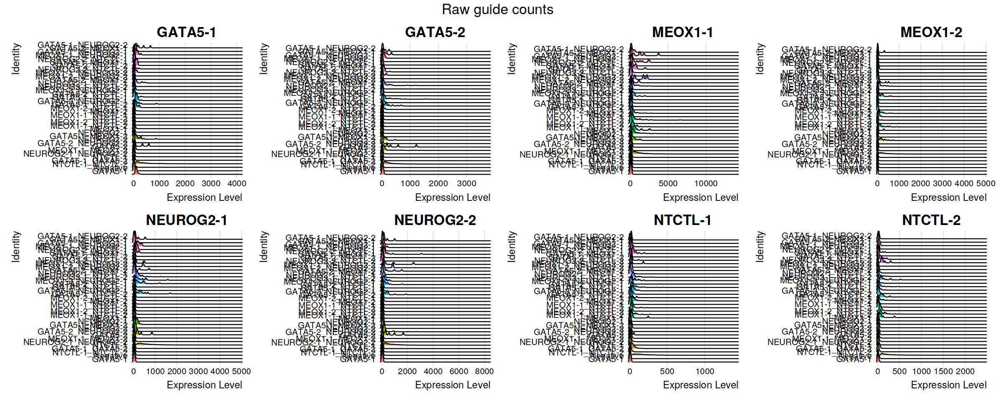

Picking joint bandwidth of 0.0903

Picking joint bandwidth of 0.00973

Picking joint bandwidth of 0.0326



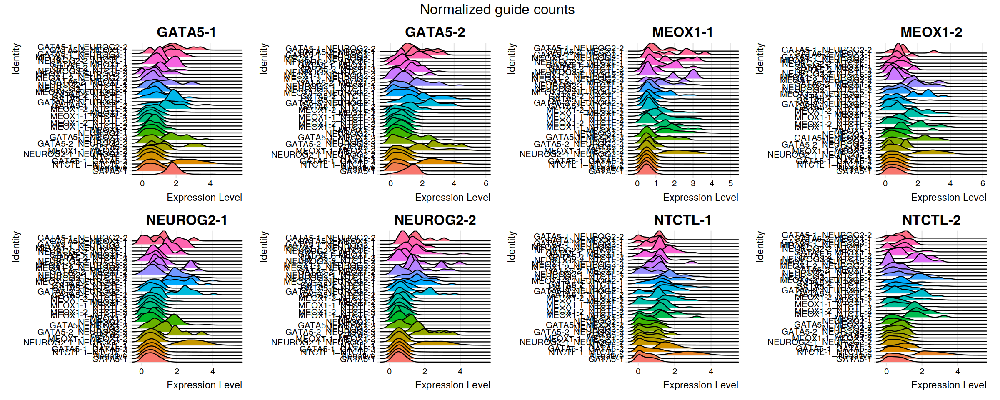

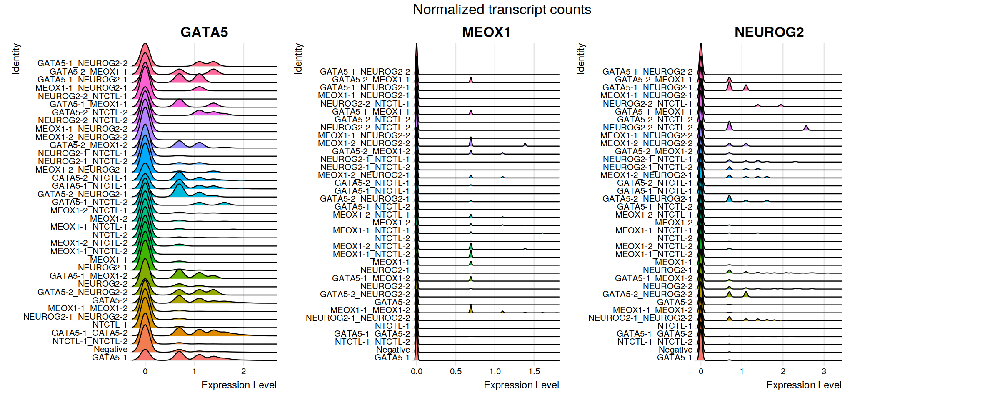

In [28]:
options(repr.plot.width = 30, repr.plot.height = 60)
tf_list <- tfs_to_plot

Idents(seurat) <- "guidecapture_classification"

RidgePlot(
    seurat,
    assay = "guidecapture",
    features = guide_names,
    slot="counts",
    ncol = 4
) + plot_annotation(title = "Raw guide counts") & theme(plot.title = element_text(hjust = 0.5, size = 20))

RidgePlot(
    seurat,
    assay = "guidecapture",
    features = guide_names,
    ncol = 4
) + plot_annotation(title = "Normalized guide counts") & theme(plot.title = element_text(hjust = 0.5, size = 20))

RidgePlot(
    seurat,
    assay = "SCT",
    features = tf_list,
    ncol = 4,
    y.max = .5
)+ plot_annotation(title = "Normalized transcript counts") & theme(plot.title = element_text(hjust = 0.5, size = 20))

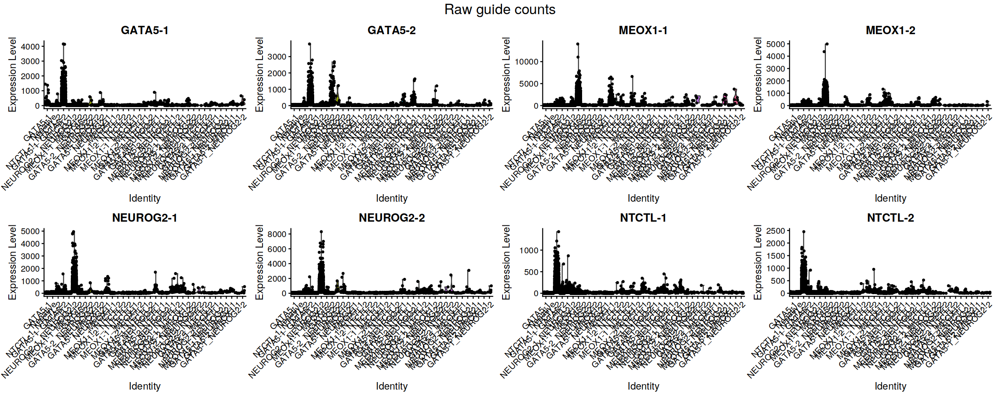

In [29]:
VlnPlot(
    seurat,
    assay = "guidecapture",
    features = guide_names,
    slot="counts",
    ncol = 4
) + plot_annotation(title = "Raw guide counts", 
                    theme = theme(plot.title = element_text(hjust = 0.5, size = 20)))


In [30]:
# FeatureScatter(seurat, feature1 = "GATA5", feature2 = "MEOX1")
# FeatureScatter(seurat, feature1 = "GATA5", feature2 = "NEUROG2")
# FeatureScatter(seurat, feature1 = "MEOX1", feature2 = "NEUROG2")

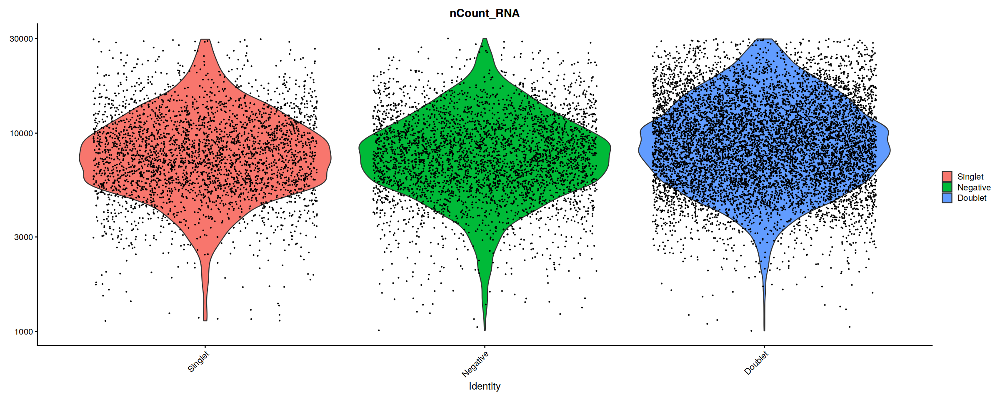

In [31]:
options(repr.plot.width = 20, repr.plot.height = 8)
Idents(seurat) <- "guidecapture_classification.global"
VlnPlot(seurat, features = "nCount_RNA", pt.size = 0.1, log = TRUE)

In [32]:
# First, we will remove negative cells from the object
seurat_subset <- subset(seurat, idents = "Negative", invert = TRUE)

# Calculate a tSNE embedding of the HTO data
DefaultAssay(seurat_subset) <- "guidecapture"

In [33]:

seurat_subset <-
    ScaleData(seurat_subset, features = guide_names, verbose = FALSE)

# seurat_subset <- RunPCA(
#     seurat_subset,
#     npcs = num_pcs,
#     ndims.print = 1:num_pcs,
#     features = guide_names,
#     approx = FALSE
# )

# seurat_subset <-
#     RunTSNE(
#         seurat_subset,
#         dims = 1:num_pcs,
#         perplexity = 100,
#         check_duplicates = FALSE
#     )

# seurat_subset <-
#     RunUMAP(seurat_subset, dims = 1:num_pcs)

#DimPlot(seurat_subset, reduction = "tsne")

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”


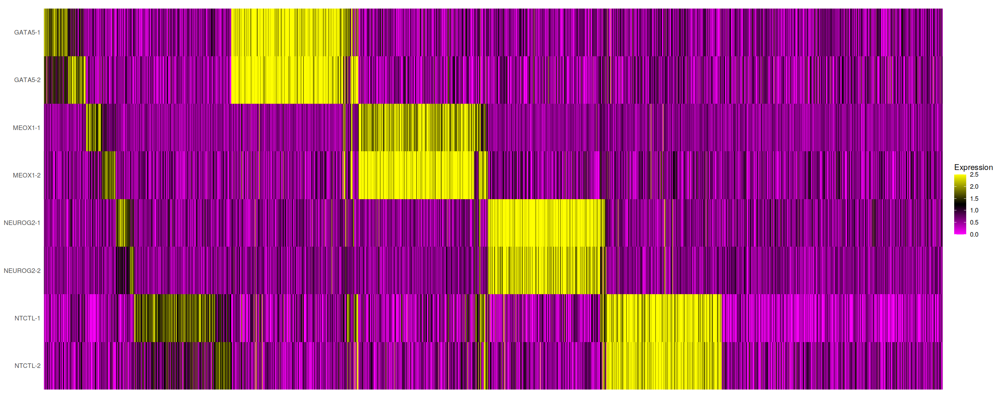

In [34]:
HTOHeatmap(seurat, assay = "guidecapture")

In [35]:
saveRDS(seurat, h5_w_gcap_name)

Warning message:
“Overwriting previous file /home/vsevim/prj/tf/CATATAC_4/analysis/secondary/CRISPR8/seurat/CATATAC_4_CRISPR8_ONLY_SINGLETS_w_GUIDE_CAP.h5seurat”
Creating h5Seurat file for version 3.1.5.9900

Adding counts for SCT

Adding data for SCT

Adding scale.data for SCT

Adding variable features for SCT

No feature-level metadata found for SCT

Writing out SCTModel.list for SCT

Adding counts for ATAC

Adding data for ATAC

Adding variable features for ATAC

Adding feature-level metadata for ATAC

Writing out ranges for ATAC

Writing out motifs for ATAC

Writing out fragments for ATAC

Writing out seqinfo for ATAC

Writing out annotation for ATAC

Writing out bias for ATAC

Writing out positionEnrichment for ATAC

Writing out links for ATAC

Adding counts for RNA

Adding data for RNA

No variable features found for RNA

No feature-level metadata found for RNA

Adding counts for guidecapture

Adding data for guidecapture

No variable features found for guidecapture

No feature-l

# Inspect results

In [179]:
# Label each cell with the number of guides detected in it by HTOdemux
seurat$perturb_targets_detected_in_cell <- colSums(sapply(seurat$guidecapture_classification, str_detect, tfs_w_ntctl))

In [180]:
# Split the surat obj into singlets, doublets, negatives
# Singlets have only one target gene detected, but can have both guides targeting it.
seurat_negatives <- subset(seurat, idents = "Negative")
seurat_singlets  <- subset(seurat, perturb_targets_detected_in_cell == 1)
seurat_doublets  <- subset(seurat, perturb_targets_detected_in_cell > 1)

In [181]:
# Assign the target gene name to singlets
x <- seurat_singlets$guidecapture_classification
target_assignments = sapply(tfs_w_ntctl, function(y) grep(y,x))

empty_vec = vector("character", length(x))
for(tf in names(target_assignments)) {
    indexes = target_assignments[[tf]]
    empty_vec[indexes] = tf
}

In [182]:
Idents(seurat_singlets) <- empty_vec
Idents(seurat_doublets) <- seurat_doublets@meta.data$guidecapture_classification

### Singlets

In [183]:
singlet_barcodes <- Cells(seurat_singlets)
select_singlets  <- df_guide$barcode_dash %in% singlet_barcodes
df_singlets      <- df_guide[select_singlets, ]

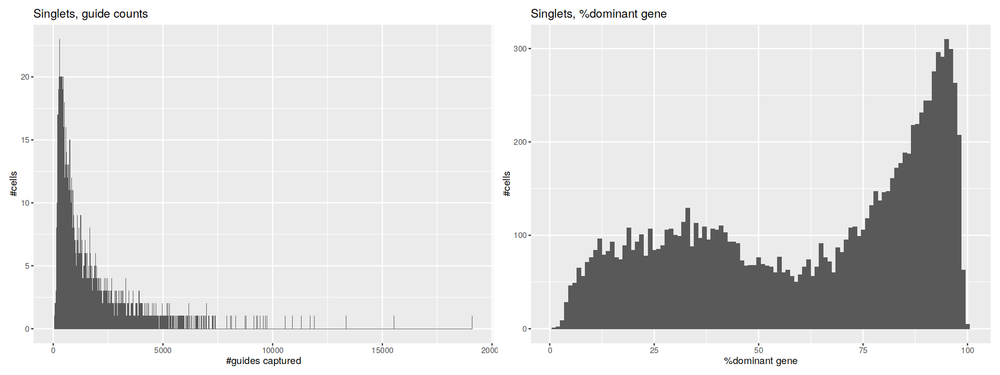

In [184]:
options(repr.plot.width = 16, repr.plot.height = 6)

plot_n_guides <- ggplot(df_singlets, aes(x = n_guides)) +
    geom_histogram(binwidth = 1) +
    labs(title = "Singlets, guide counts", x = "#guides captured") +
    labs(y = "#cells")

plot_dominant <- ggplot(df_singlets, aes(x = percent_dominant_gene)) +
    geom_histogram(binwidth = 1) +
    labs(title = "Singlets, %dominant gene", x = "%dominant gene") +
    labs(y = "#cells")

plot_n_guides | plot_dominant

### Negatives

In [185]:
negative_barcodes <- Cells(seurat_negatives)
select_negatives  <- df_guide$barcode_dash %in% negative_barcodes
df_negatives      <- df_guide[select_negatives, ]

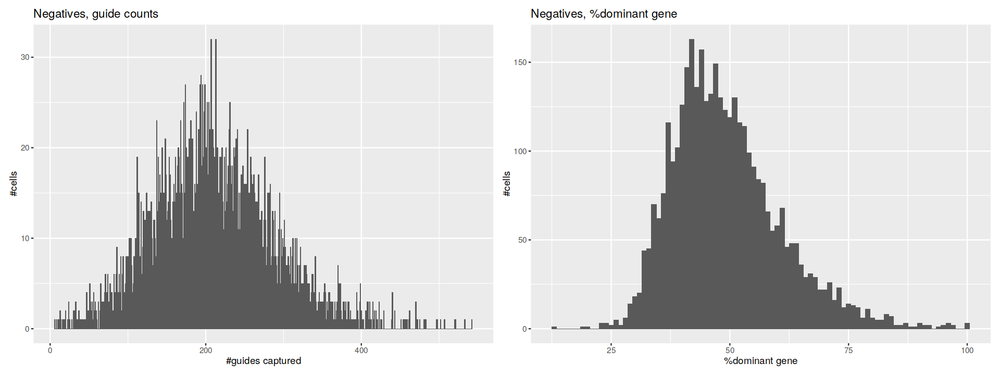

In [186]:
options(repr.plot.width = 16, repr.plot.height = 6)

plot_n_guides <- ggplot(df_negatives, aes(x = n_guides)) +
    geom_histogram(binwidth = 1) +
    labs(title = "Negatives, guide counts", x = "#guides captured") +
    labs(y = "#cells")

plot_dominant <- ggplot(df_negatives, aes(x = percent_dominant_gene)) +
    geom_histogram(binwidth = 1) +
    labs(title = "Negatives, %dominant gene", x = "%dominant gene") +
    labs(y = "#cells")

plot_n_guides | plot_dominant

In [187]:
sample_n(df_negatives, 10)

barcode,GATA5,MEOX1,NEUROG2,NTCTL,n_guides,GATA5_1,GATA5_2,MEOX1_1,MEOX1_2,NEUROG2_1,NEUROG2_2,NTCTL_1,NTCTL_2,barcode_dash,dominant_gene_w_caveat,dominant_gene_count,percent_dominant_gene,targeted_gene_count,in_multiome
<chr>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<chr>,<chr>,<int>,<dbl>,<int>,<lgl>
CACAAGCGTGAGGTGA,24,139,89,51,303,24,0,139,0,4,85,16,35,CACAAGCGTGAGGTGA-1,MEOX1,139,45.87459,3,TRUE
AGTAATCGTTAATGAC,28,181,52,3,264,28,0,129,52,28,24,3,0,AGTAATCGTTAATGAC-1,MEOX1,181,68.56061,3,TRUE
GCCTCCATCGCACAAT,9,23,65,15,112,5,4,2,21,23,42,0,15,GCCTCCATCGCACAAT-1,NEUROG2,65,58.03571,3,TRUE
ATTGGCTAGATACTTG,89,3,1,0,93,68,21,3,0,1,0,0,0,ATTGGCTAGATACTTG-1,GATA5,89,95.69892,3,TRUE
CGTCAATAGACAACGA,14,158,147,52,371,7,7,92,66,73,74,13,39,CGTCAATAGACAACGA-1,MEOX1,158,42.58760,3,TRUE
ACTTGCACACCTCACC,7,79,37,5,128,0,7,57,22,30,7,3,2,ACTTGCACACCTCACC-1,MEOX1,79,61.71875,3,TRUE
GGACTAAAGGCGGGTA,6,56,64,42,168,6,0,39,17,33,31,14,28,GGACTAAAGGCGGGTA-1,NEUROG2,64,38.09524,3,TRUE
ACAACATGTTCCTCCT,105,39,108,2,254,52,53,39,0,51,57,0,2,ACAACATGTTCCTCCT-1,NEUROG2,108,42.51969,3,TRUE
CCAGCTAAGGGCTTAT,19,67,38,62,186,16,3,50,17,23,15,16,46,CCAGCTAAGGGCTTAT-1,MEOX1,67,36.02151,3,TRUE


In [188]:
#hist(df_singlets$GATA5)

In [189]:
library(cluster)
library(fitdistrplus)

MaxN <- function(x, N = 2){
  len <- length(x)
  if (N > len) {
    warning('N greater than length(x).  Setting N=length(x)')
    N <- length(x)
  }
  sort(x, partial = len - N + 1)[len - N + 1]
}

myHTODemux <- function(
  object,
  assay = "HTO",
  positive.quantile = 0.99,
  init = NULL,
  nstarts = 100,
  kfunc = "clara",
  nsamples = 100,
  seed = 42,
  verbose = TRUE
) {
  if (!is.null(x = seed)) {
    set.seed(seed = seed)
  }
  #initial clustering
  assay <- assay %||% DefaultAssay(object = object)
  data <- GetAssayData(object = object, assay = assay)
  counts <- GetAssayData(
    object = object,
    assay = assay,
    slot = 'counts'
  )[, colnames(x = object)]
  counts <- as.matrix(x = counts)
  ncenters <- init %||% (nrow(x = data) + 1)
  switch(
    EXPR = kfunc,
    'kmeans' = {
      init.clusters <- kmeans(
        x = t(x = GetAssayData(object = object, assay = assay)),
        centers = ncenters,
        nstart = nstarts
      )
      #identify positive and negative signals for all HTO
      Idents(object = object, cells = names(x = init.clusters$cluster)) <- init.clusters$cluster
    },
    'clara' = {
      #use fast k-medoid clustering
      init.clusters <- clara(
        x = t(x = GetAssayData(object = object, assay = assay)),
        k = ncenters,
        samples = nsamples
      )
      #identify positive and negative signals for all HTO
      Idents(object = object, cells = names(x = init.clusters$clustering), drop = TRUE) <- init.clusters$clustering
    },
    stop("Unknown k-means function ", kfunc, ", please choose from 'kmeans' or 'clara'")
  )
  #average hto signals per cluster
  #work around so we don't average all the RNA levels which takes time
  average.expression <- AverageExpression(
    object = object,
    assays = assay,
    verbose = FALSE
  )[[assay]]
  #checking for any cluster with all zero counts for any barcode
  if (sum(average.expression == 0) > 0) {
    stop("Cells with zero counts exist as a cluster.")
  }
  #create a matrix to store classification result
  discrete <- GetAssayData(object = object, assay = assay)
  discrete[discrete > 0] <- 0
  # for each HTO, we will use the minimum cluster for fitting
  for (iter in rownames(x = data)) {
    values <- counts[iter, colnames(object)]
    #commented out if we take all but the top cluster as background
    #values_negative=values[setdiff(object@cell.names,WhichCells(object,which.max(average.expression[iter,])))]
    values.use <- values[WhichCells(
      object = object,
      idents = levels(x = Idents(object = object))[[which.min(x = average.expression[iter, ])]]
    )]
    fit <- suppressWarnings(expr = fitdist(data = values.use, distr = "nbinom"))
    cutoff <- as.numeric(x = quantile(x = fit, probs = positive.quantile)$quantiles[1])
    discrete[iter, names(x = which(x = values > cutoff))] <- 1
    if (verbose) {
      message(paste0("Cutoff for ", iter, " : ", cutoff, " reads"))
    }
  }
  # now assign cells to HTO based on discretized values
  npositive <- colSums(x = discrete)
  classification.global <- npositive
  classification.global[npositive == 0] <- "Negative"
  classification.global[npositive == 1] <- "Singlet"
  classification.global[npositive > 1] <- "Doublet"
  donor.id = rownames(x = data)
  hash.max <- apply(X = data, MARGIN = 2, FUN = max)
  hash.maxID <- apply(X = data, MARGIN = 2, FUN = which.max)
  hash.second <- apply(X = data, MARGIN = 2, FUN = MaxN, N = 2)
  hash.maxID <- as.character(x = donor.id[sapply(
    X = 1:ncol(x = data),
    FUN = function(x) {
      return(which(x = data[, x] == hash.max[x])[1])
    }
  )])
  hash.secondID <- as.character(x = donor.id[sapply(
    X = 1:ncol(x = data),
    FUN = function(x) {
      return(which(x = data[, x] == hash.second[x])[1])
    }
  )])
  hash.margin <- hash.max - hash.second
  doublet_id <- sapply(
    X = 1:length(x = hash.maxID),
    FUN = function(x) {
      return(paste(sort(x = c(hash.maxID[x], hash.secondID[x])), collapse = "_"))
    }
  )
  # doublet_names <- names(x = table(doublet_id))[-1] # Not used
  classification <- classification.global
  classification[classification.global == "Negative"] <- "Negative"
  classification[classification.global == "Singlet"] <- hash.maxID[which(x = classification.global == "Singlet")]
  classification[classification.global == "Doublet"] <- doublet_id[which(x = classification.global == "Doublet")]
  classification.metadata <- data.frame(
    hash.maxID,
    hash.secondID,
    hash.margin,
    classification,
    classification.global
  )
  colnames(x = classification.metadata) <- paste(
    assay,
    c('maxID', 'secondID', 'margin', 'classification', 'classification.global'),
    sep = '_'
  )
  object <- AddMetaData(object = object, metadata = classification.metadata)
  Idents(object) <- paste0(assay, '_classification')
  # Idents(object, cells = rownames(object@meta.data[object@meta.data$classification.global == "Doublet", ])) <- "Doublet"
  doublets <- rownames(x = object[[]])[which(object[[paste0(assay, "_classification.global")]] == "Doublet")]
  Idents(object = object, cells = doublets) <- 'Doublet'
  # object@meta.data$hash.ID <- Idents(object)
  object$hash.ID <- Idents(object = object)
  return(discrete)
}


In [190]:
seurat_alt <- subset(seurat, cells = Cells(seurat))
disc <- myHTODemux(seurat_alt, assay = "guidecapture", positive.quantile = 0.99)

Cutoff for GATA5-1 : 83 reads

Cutoff for GATA5-2 : 72 reads

Cutoff for MEOX1-1 : 203 reads

Cutoff for MEOX1-2 : 68 reads

Cutoff for NEUROG2-1 : 129 reads

Cutoff for NEUROG2-2 : 147 reads

Cutoff for NTCTL-1 : 18 reads

Cutoff for NTCTL-2 : 72 reads



# Visualize guides by clusters

## Singlets only

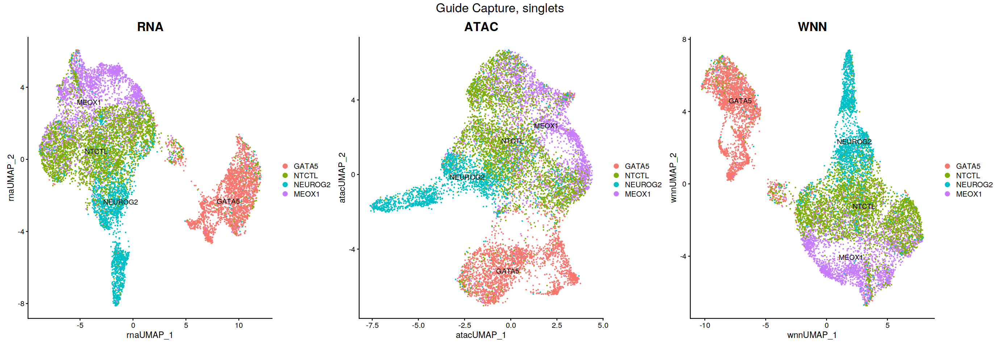

In [192]:
options(repr.plot.width = 23, repr.plot.height = 8)
#Idents(seurat_singlets) <- seurat_singlets@meta.data$guidecapture_classification

p1 <- DimPlot(seurat_singlets, reduction = "umap.rna", label = TRUE, label.size = 6, repel = TRUE) + ggtitle("RNA")
p2 <- DimPlot(seurat_singlets, reduction = "umap.atac", label = TRUE, label.size = 6, repel = TRUE) + ggtitle("ATAC")
p3 <- DimPlot(seurat_singlets, reduction = "wnn.umap", label = TRUE, label.size = 6, repel = TRUE) + ggtitle("WNN")
p1 + p2 + p3 & plot_annotation(title = "Guide Capture, singlets") & 
theme(plot.title = element_text(hjust = 0.5, size = 20)) +
theme(axis.title = element_text(size = 18))   

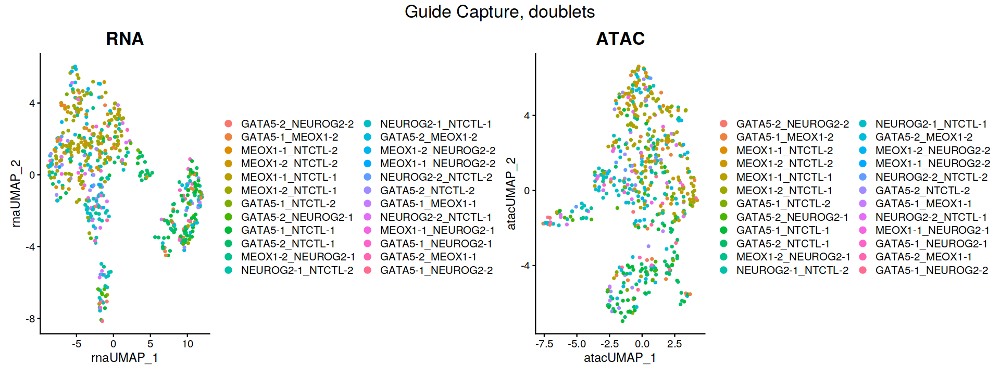

In [193]:
options(repr.plot.width = 70, repr.plot.height = 20)
p1 <- DimPlot(seurat_doublets, reduction = "umap.rna", label = FALSE, label.size = 6) + ggtitle("RNA")
p2 <- DimPlot(seurat_doublets, reduction = "umap.atac", label = FALSE, label.size = 6) + ggtitle("ATAC")
p1 + p2 & plot_annotation(title = "Guide Capture, doublets") &
theme(plot.title = element_text(hjust = 0.5, size = 20))

#p3 <- DimPlot(seurat_doublets, reduction = "wnn.umap", label = TRUE, label.size = 6, repel = TRUE) + ggtitle("WNN")

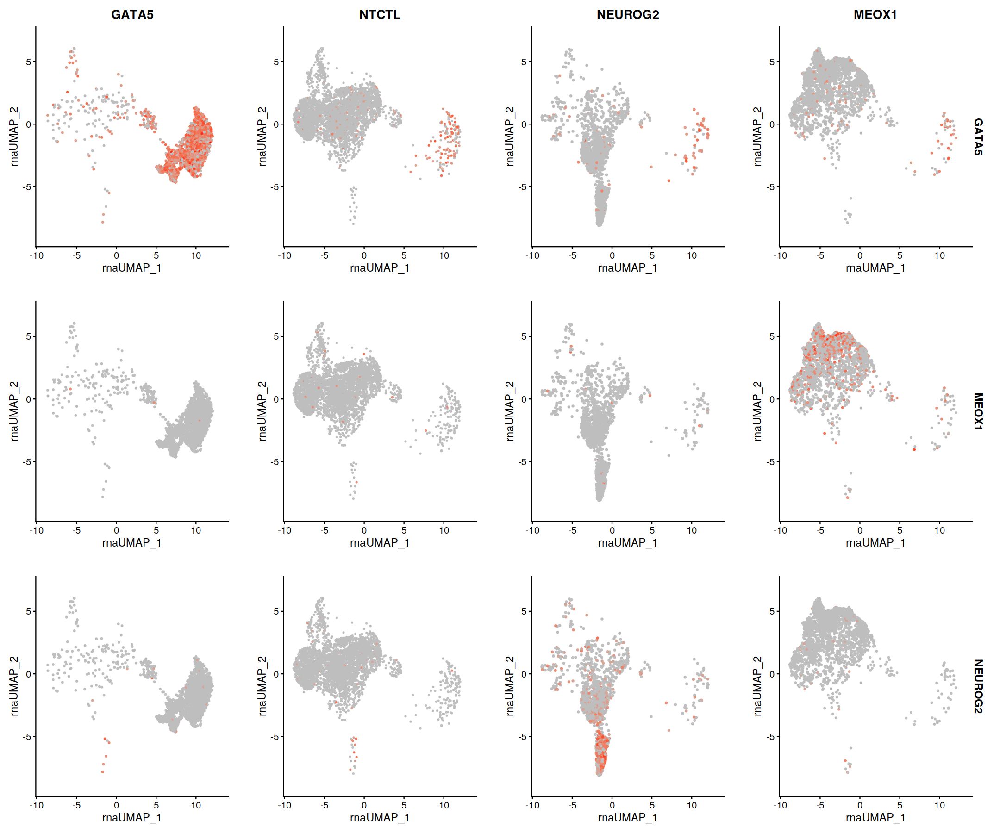

In [194]:
options(repr.plot.width = 54, repr.plot.height = 45)
tf_list <- tfs_to_plot

FeaturePlot(
    seurat_singlets,
    features = tf_list, 
    split.by = 'ident', 
    reduction = 'umap.rna', 
    cols = c("grey", "red"),
    keep.scale = "feature"
)

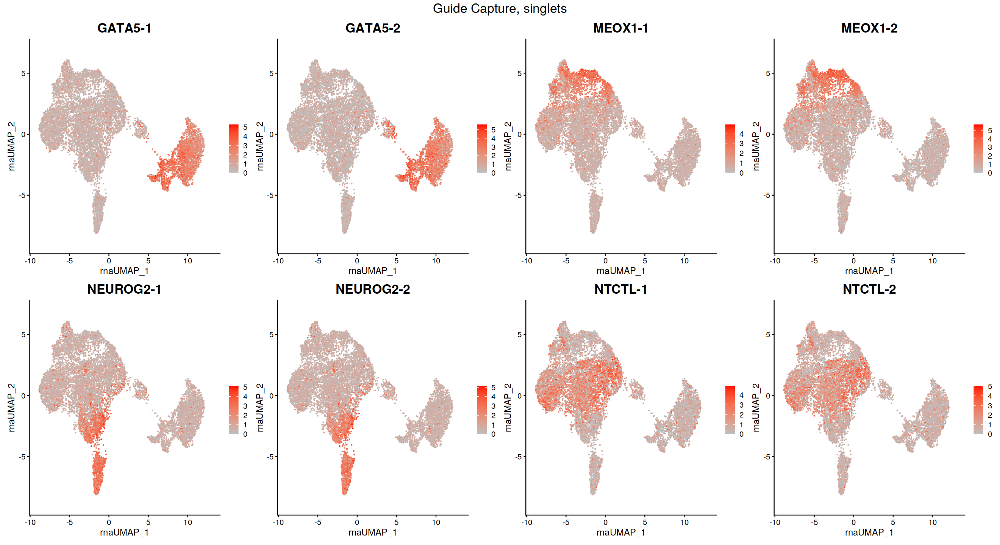

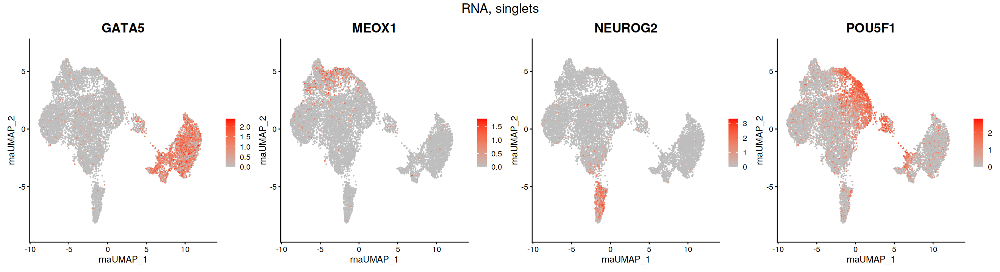

In [213]:
options(repr.plot.width = 36, repr.plot.height = 12)
guide_list <- gsub("_", "-", guides_to_plot)
DefaultAssay(seurat_singlets) <- "guidecapture"

FeaturePlot(
    seurat_singlets,
    features = guide_list,
    reduction = 'umap.rna',
    cols = c("grey", "red"),
    keep.scale = "feature",
    ncol = length(guide_list)/2
) +
plot_annotation(title = "Guide Capture, singlets") &
theme(plot.title = element_text(hjust = 0.5, size = 20))

options(repr.plot.width = 50, repr.plot.height = 6)
tf_list <- c(tfs_to_plot, "POU5F1")
DefaultAssay(seurat_singlets) <- "SCT"
FeaturePlot(
    seurat_singlets,
    features = tf_list,
    reduction = 'umap.rna',
    cols = c("grey", "red"),
    keep.scale = "feature",
    ncol = length(tf_list)
) +
plot_annotation(title = "RNA, singlets") &
theme(plot.title = element_text(hjust = 0.5, size = 20))



In [196]:
tfs_to_plot

[1] "GATA5"   "MEOX1"   "NEUROG2"

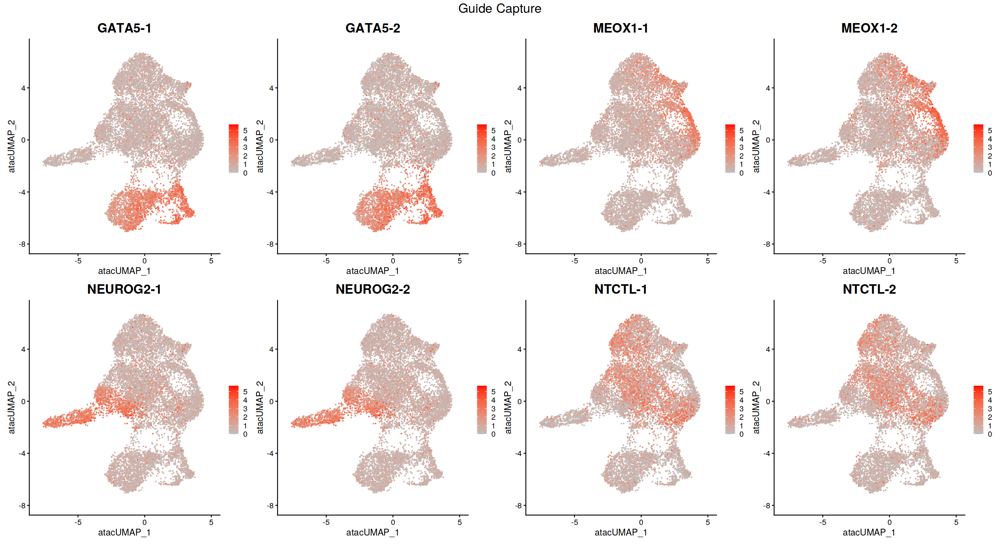

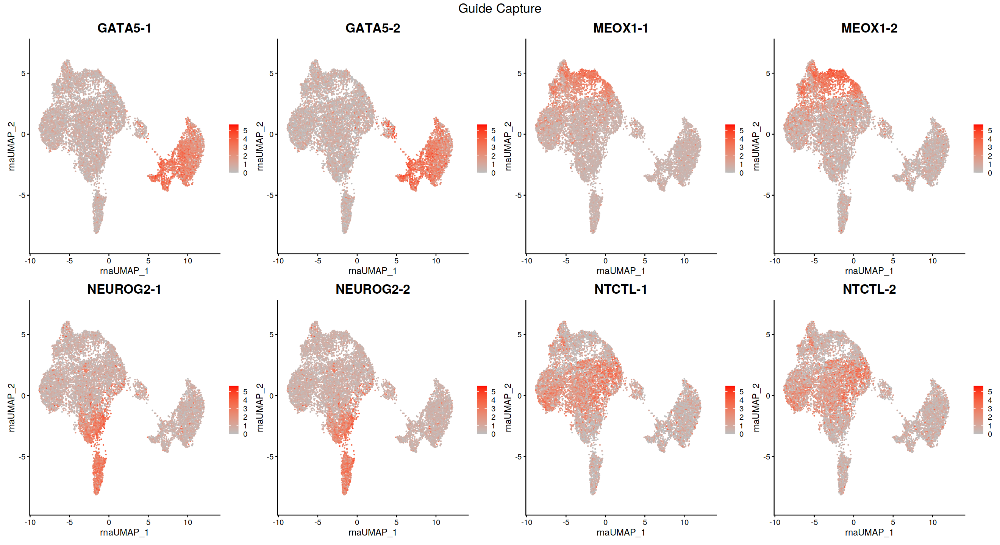

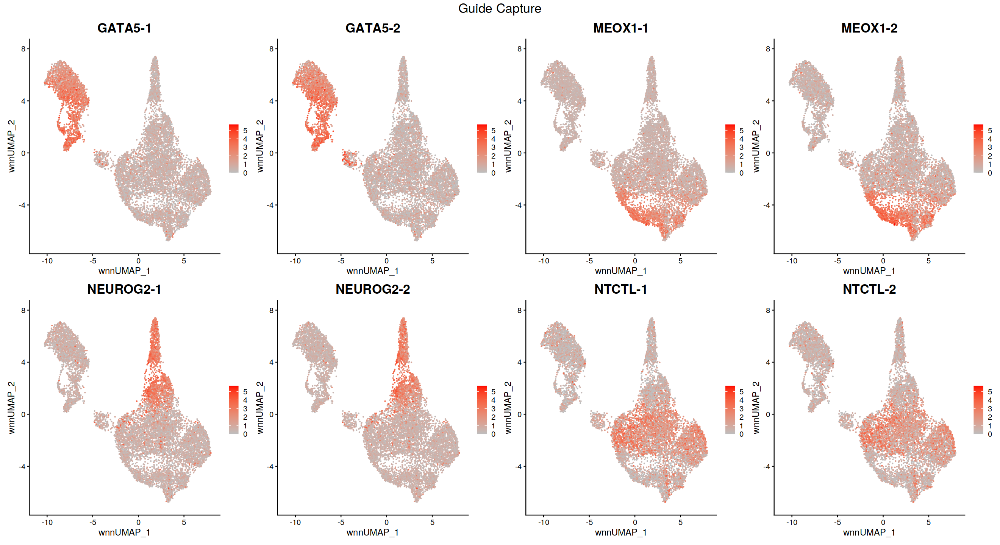

In [218]:
library(patchwork)
options(repr.plot.width = 32, repr.plot.height = 12)
tf_list <- tfs_to_plot
guide_list <- gsub("_", "-", guides_to_plot)

DefaultAssay(seurat_singlets) <- "guidecapture"
FeaturePlot(
    seurat_singlets,
    features = guide_list,
    reduction = 'umap.atac',
    cols = c("grey", "red"),
    keep.scale = "all",
    ncol = length(guide_list)/2
) +
plot_annotation(title = "Guide Capture") &
theme(plot.title = element_text(hjust = 0.5, size = 20))

FeaturePlot(
    seurat_singlets,
    features =guide_list,
    reduction = 'umap.rna',
    cols = c("grey", "red"),
    keep.scale = "all",
    ncol = length(guide_list)/2
) +
plot_annotation(title = "Guide Capture") &
theme(plot.title = element_text(hjust = 0.5, size = 20))

FeaturePlot(
    seurat_singlets,
    features = guide_list,
    reduction = 'wnn.umap',
    cols = c("grey", "red"),
    keep.scale = "all",
    ncol = length(guide_list)/2
) +
plot_annotation(title = "Guide Capture") &
theme(plot.title = element_text(hjust = 0.5, size = 20))



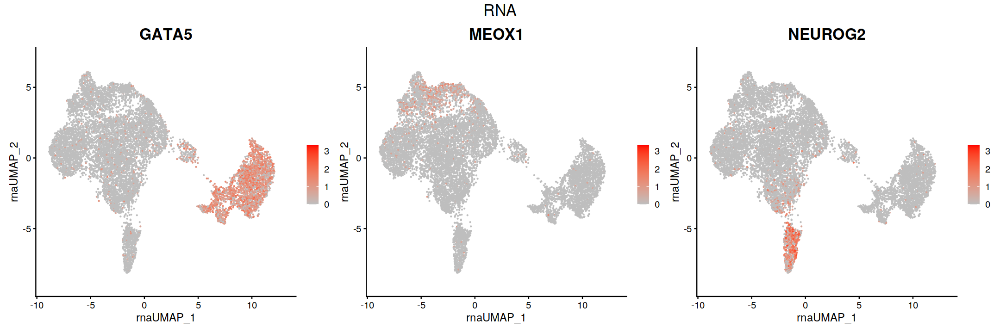

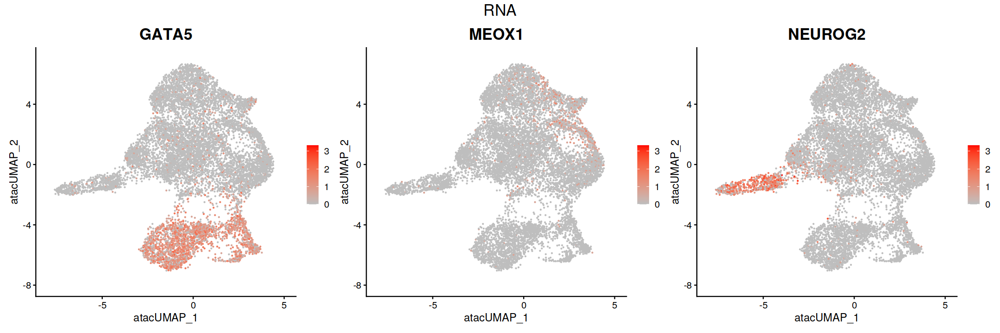

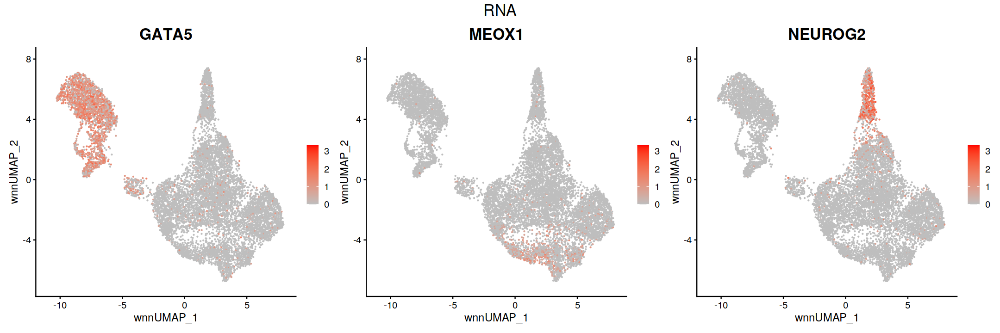

In [219]:

options(repr.plot.width = 50, repr.plot.height = 12)
tf_list <- tfs_to_plot
DefaultAssay(seurat_singlets) <- "SCT"

FeaturePlot(
    seurat_singlets,
    features = tf_list,
    reduction = 'umap.rna',
    cols = c("grey", "red"),
    keep.scale = "all",
    ncol = length(tf_list)
) +
plot_annotation(title = "RNA") &
theme(plot.title = element_text(hjust = 0.5, size = 20))

FeaturePlot(
    seurat_singlets,
    features = tf_list,
    reduction = 'umap.atac',
    cols = c("grey", "red"),
    keep.scale = "all",
    ncol = length(tf_list)
) +
plot_annotation(title = "RNA") &
theme(plot.title = element_text(hjust = 0.5, size = 20))

FeaturePlot(
    seurat_singlets,
    features = tf_list,
    reduction = 'wnn.umap',
    cols = c("grey", "red"),
    keep.scale = "all",
    ncol = length(tf_list)
) +
plot_annotation(title = "RNA") &
theme(plot.title = element_text(hjust = 0.5, size = 20))

## Doublets only

Warning message:
“ggrepel: 8 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


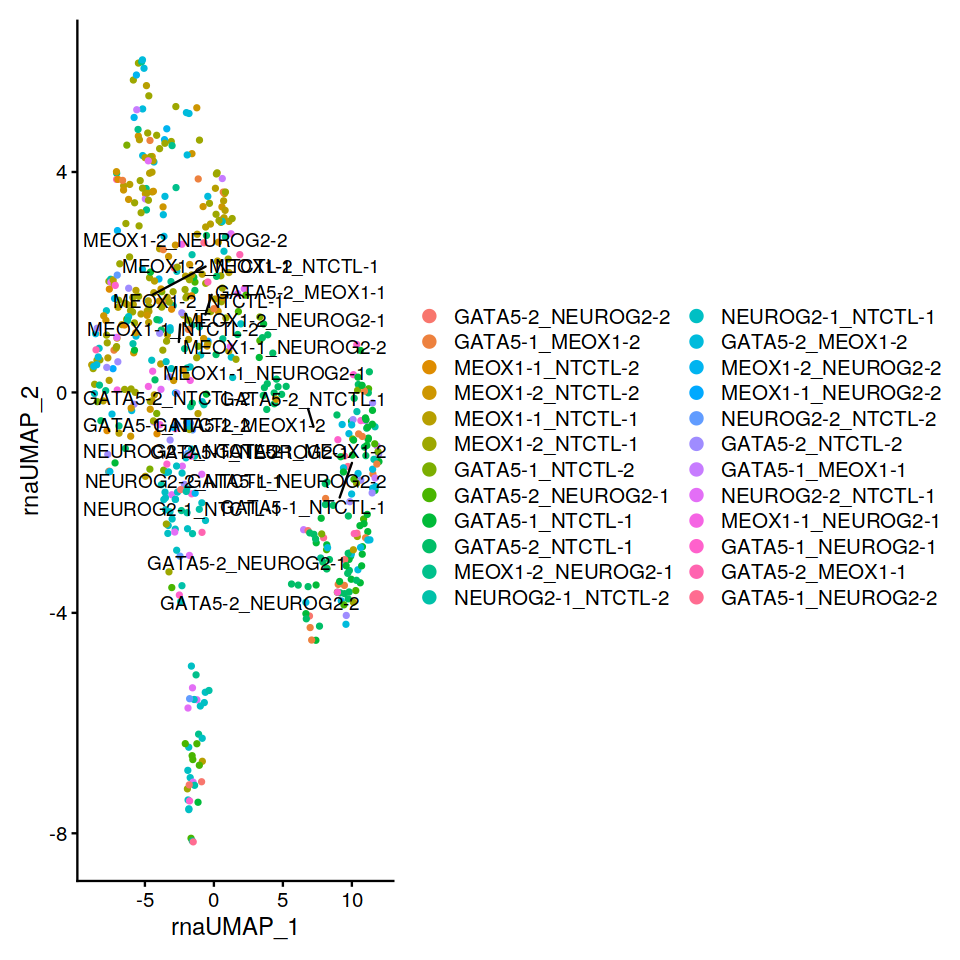

In [220]:
options(repr.plot.width = 8, repr.plot.height = 8)

Idents(seurat_doublets) <- seurat_doublets@meta.data$guidecapture_classification

plot <- DimPlot(
    seurat_doublets,
    reduction = "umap.rna"
)
LabelClusters(
    plot = plot,
    id = "ident"
)

In [231]:
# options(repr.plot.width = 48, repr.plot.height = 15)
# tf_list <- tfs_to_plot
# DefaultAssay(seurat_singlets) <- "SCT"

# FeaturePlot(
#     seurat_doublets,
#     features = tf_list, 
#     split.by = 'ident', 
#     reduction = 'umap.rna', 
#     cols = c("grey", "red"),
#     keep.scale = "all"
# )

# Get cell counts in clusters

In [232]:
Assays(seurat_singlets)

[1] "SCT"          "ATAC"         "RNA"          "guidecapture"

In [233]:

DefaultAssay(seurat_singlets) <- "RNA"
seurat_singlets@meta.data$seurat_clusters
seurat_singlets <- StashIdent(seurat_singlets, save.name = "current.ident")

[1] 12 0  9  2  12 1  4  5  9  4  7  0  0  2  2  7  4  6  4  1  2  5  9  2 
   [25] 2  5  0  7  5  2  3  2  1  11 5  8  4  1  1  4  1  6  1  6  9  7  0  8 
   [49] 2  6  7  4  0  9  1  12 2  0  1  2  4  0  7  11 4  1  6  5  1  0  4  13
   [73] 8  7  8  3  5  4  12 7  13 13 4  2  10 0  6  3  2  1  3  3  2  1  5  9 
   [97] 11 0  1  6  4  1  5  12 0  1  0  14 7  2  6  6  5  11 0  2  5  13 0  4 
  [121] 1  8  5  4  9  1  9  0  3  1  2  7  7  1  8  4  1  4  7  13 6  0  7  2 
  [145] 1  1  13 1  4  1  2  7  12 0  12 11 2  2  8  0  3  6  0  7  1  0  0  1 
  [169] 5  2  5  8  7  6  2  9  2  0  6  2  4  4  5  12 13 1  2  6  8  1  0  2 
  [193] 2  5  4  4  11 4  5  11 12 7  0  12 11 8  4  0  1  2  8  0  3  11 4  1 
  [217] 3  11 2  9  12 1  5  12 4  1  0  9  2  6  4  7  2  8  1  6  7  1  7  0 
  [241] 11 3  6  4  8  6  6  6  1  9  2  2  6  2  11 1  3  0  11 14 2  5  4  11
  [265] 0  2  10 12 5  5  5  3  7  7  11 4  2  6  8  3  8  1  2  5  9  11 7  3 
  [289] 6  0  5  4  1  0  12 4  4  11 1  6  8  5  3  2  2  1  0  1  2  5  1  1 
  [313] 0  8  2  11 2  10 12 13 5  8  3  7  8  8  6  3  8  4  4  3  1  9  1  8 
  [337] 0  5  1  4  0  2  3  3  2  2  5  1  2  4  9  5  5  3  9  1  4  14 1  9 
  [361] 5  1  11 8  7  4  2  7  0  1  8  4  1  4  10 9  2  9  1  6  2  9  5  14
  [385] 2  2  0  2  3  5  1  0  5  11 5  4  12 0  7  12 0  1  0  5  9  1  5  3 
  [409] 1  2  0  2  4  2  2  4  7  5  0  4  2  4  0  0  12 3  3  0  14 4  0  2 
  [433] 4  6  1  8  8  11 3  2  1  8  0  10 4  7  5  2  2  1  8  1  5  2  5  4 
  [457] 6  9  4  1  1  0  12 5  5  8  12 3  3  1  7  0  2  7  5  2  9  7  7  6 
  [481] 1  5  7  2  3  0  1  1  2  9  3  6  3  4  3  12 0  2  10 2  3  3  3  2 
  [505] 4  2  8  5  13 0  1  4  11 1  2  1  5  3  1  3  2  2  3  3  0  2  11 0 
  [529] 11 3  4  1  2  0  0  8  5  1  3  7  5  6  1  9  3  5  4  0  5  2  6  2 
  [553] 2  6  1  4  11 9  0  3  4  2  6  5  0  0  13 5  4  2  9  12 5  2  9  0 
  [577] 2  2  1  6  3  5  13 4  1  9  14 5  12 1  8  4  0  6  0  2  12 11 2  4 
  [601] 2  13 0  13 0  2  0  8  4  4  1  6  2  4  0  6  7  4  9  1  8  0  1  2 
  [625] 2  2  5  8  4  9  4  5  3  2  10 3  8  0  3  1  0  3  0  12 3  2  0  3 
  [649] 0  4  1  1  8  2  5  2  6  4  1  10 0  5  5  9  6  4  8  1  3  4  0  5 
  [673] 4  0  2  1  0  11 2  4  5  12 13 3  8  4  2  7  2  1  9  3  1  7  8  4 
  [697] 3  13 8  10 4  2  2  2  11 3  3  4  8  0  12 1  2  5  4  1  14 7  11 11
  [721] 2  6  6  1  14 5  9  4  3  9  10 1  1  3  6  12 6  8  2  6  2  1  1  11
  [745] 0  5  7  1  1  6  7  5  6  5  0  0  8  4  5  2  11 12 1  6  4  4  4  0 
  [769] 1  11 2  8  4  14 2  0  14 0  2  9  0  6  5  4  2  6  11 0  2  1  2  4 
  [793] 11 14 4  4  2  2  2  1  4  13 1  6  8  10 3  0  6  9  3  0  1  4  6  3 
  [817] 1  2  11 0  1  2  4  10 0  3  0  2  14 3  4  5  4  0  14 9  0  2  14 5 
  [841] 6  0  0  1  4  1  0  5  8  13 6  6  0  0  6  5  5  0  5  1  1  0  1  12
  [865] 12 4  11 4  9  2  9  8  5  4  4  11 11 2  5  9  12 1  0  0  8  2  8  2 
  [889] 3  0  3  9  13 3  7  4  4  7  3  4  1  9  1  0  3  12 8  2  5  5  3  11
  [913] 3  5  5  4  0  0  2  5  4  1  4  5  0  1  2  12 2  12 9  5  5  2  14 11
  [937] 8  12 6  9  5  1  12 4  0  10 5  11 11 8  14 2  1  7  0  6  3  3  12 0 
  [961] 2  5  5  5  8  5  14 5  6  12 3  1  0  13 10 2  6  4  9  8  12 6  12 6 
  [985] 2  10 4  0  2  7  5  8  1  8  7  6  11 8  14 13 11 12 7  6  8  0  0  0 
 [1009] 5  2  0  4  5  3  8  1  1  11 0  4  5  2  4  1  5  2  10 1  3  1  9  1 
 [1033] 1  8  8  2  2  6  9  5  2  8  4  0  2  2  5  0  6  1  2  9  3  0  12 5 
 [1057] 8  5  9  3  7  3  5  4  0  0  6  0  0  5  1  12 4  2  4  2  13 2  4  6 
 [1081] 5  6  7  9  13 4  0  0  5  2  0  7  11 8  2  4  1  4  9  1  3  9  3  1 
 [1105] 4  0  1  2  3  1  3  3  11 11 0  0  1  3  1  2  4  1  9  0  9  2  0  3 
 [1129] 9  4  13 5  1  1  14 12 0  5  6  5  6  3  2  1  1  11 9  6  11 5  3  2 
 [1153] 4  12 3  6  2  2  8  1  11 2  4  0  8  0  1  0  2  2  6  2  3  1  2  8 
 [1177] 2  3  6  6  2  11 5  5  2  1  1  2  1  2  5  3  7  1  13 3  1  0  14 4 
 [12

With Seurat 3.X, stashing identity classes can be accomplished with the following:
seurat_singlets[["current.ident"]] <- Idents(object = seurat_singlets)



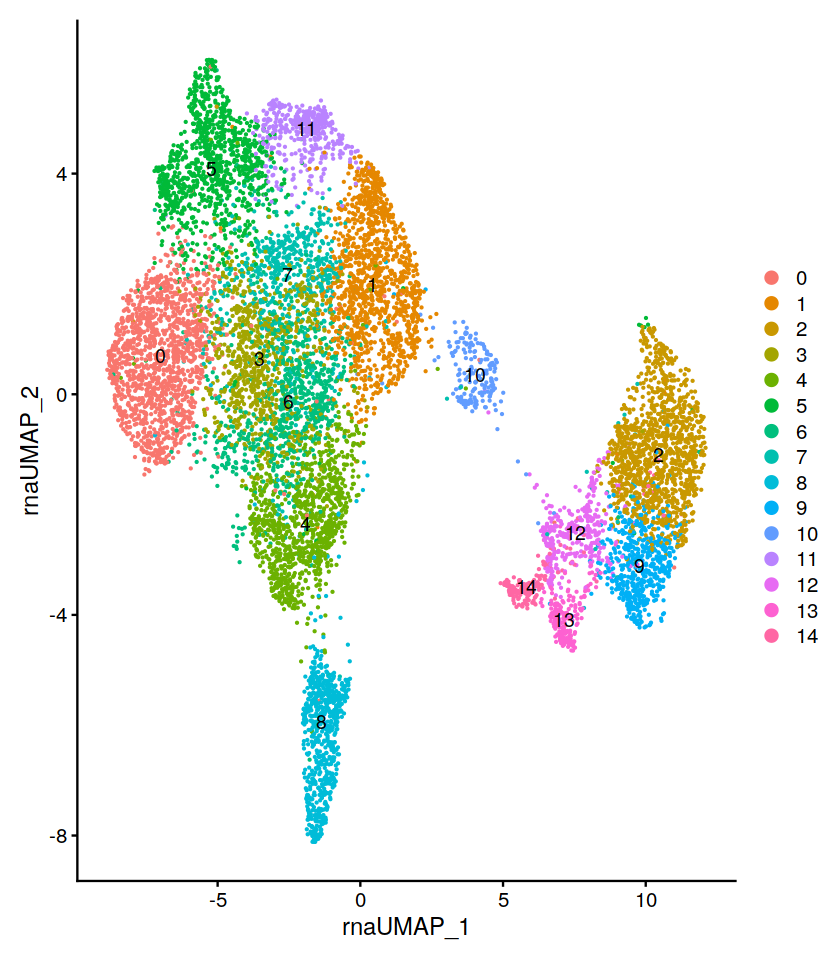

In [234]:
options(repr.plot.width = 7, repr.plot.height = 8)
seurat_singlets <- SetIdent(seurat_singlets, value = seurat_singlets@meta.data$seurat_clusters)
DimPlot(seurat_singlets, reduction = 'umap.rna', label = TRUE)

In [235]:
cluster_counts <- table(Idents(seurat_singlets))
as.data.frame(cluster_counts)


Var1,Freq
<fct>,<int>
0,1438
1,1240
2,1258
3,847
4,1058
5,1061
6,817
7,591
8,694


In [236]:
#cluster_counts[['2']] + cluster_counts[['5']] + cluster_counts[['11']] + cluster_counts[['13']] + cluster_counts[['14']]

In [237]:
DefaultAssay(seurat_singlets) <- "guidecapture"
Idents(seurat_singlets) <- "guidecapture_classification"

In [238]:
# seurat_ngn2 <- subset(seurat_singlets, idents = tfs_w_ntctl[1])
# hist(seurat_ngn2@meta.data$SCT.weight)

ERROR: Error in WhichCells.Seurat(object = x, cells = cells, idents = idents, : Cannot find the following identities in the object: GATA5


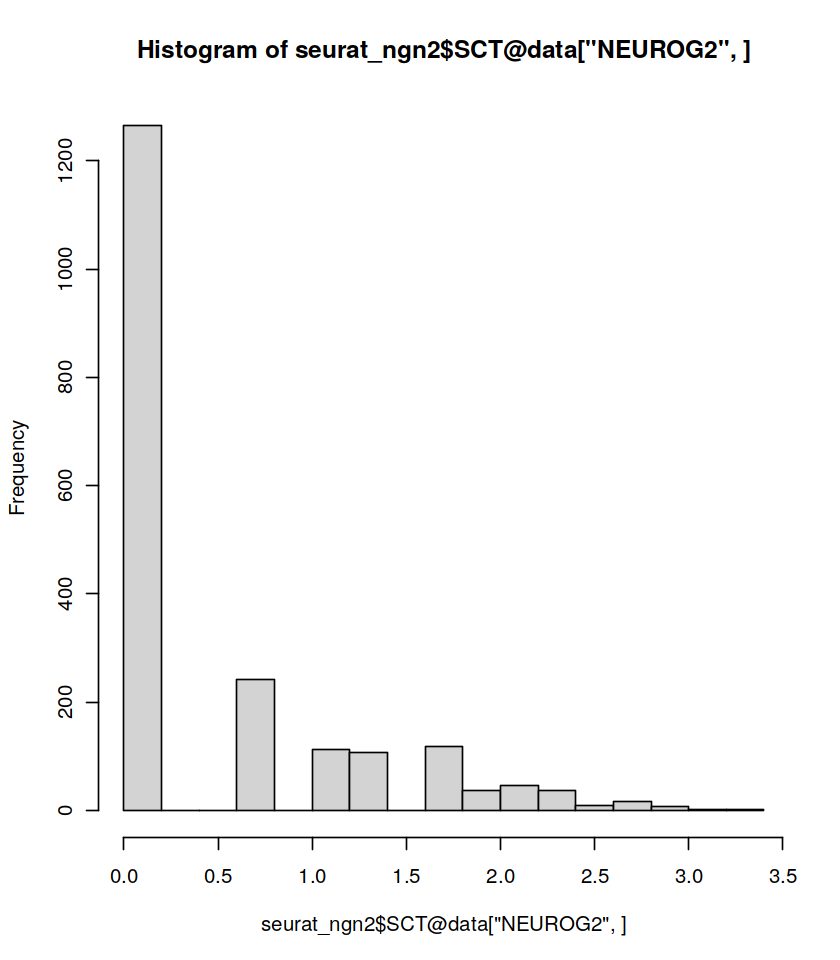

In [ ]:
#hist(seurat_ngn2$SCT@data[tfs_w_ntctl[1],])

Picking joint bandwidth of 0.107

Picking joint bandwidth of 0.132

Picking joint bandwidth of 0.0804

Picking joint bandwidth of 0.114

Picking joint bandwidth of 0.0998

Picking joint bandwidth of 0.0845

Picking joint bandwidth of 0.122

Picking joint bandwidth of 0.113

Picking joint bandwidth of 0.0372

Picking joint bandwidth of 0.00679

Picking joint bandwidth of 0.0126



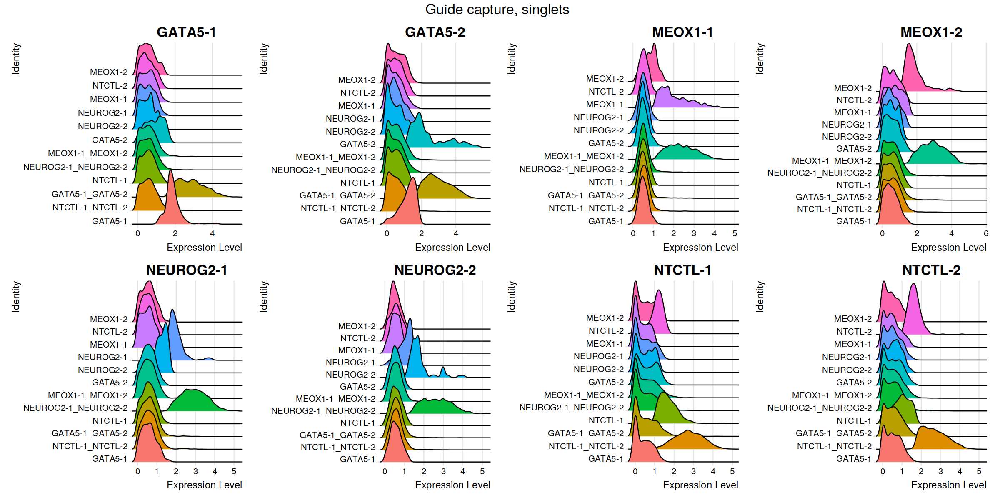

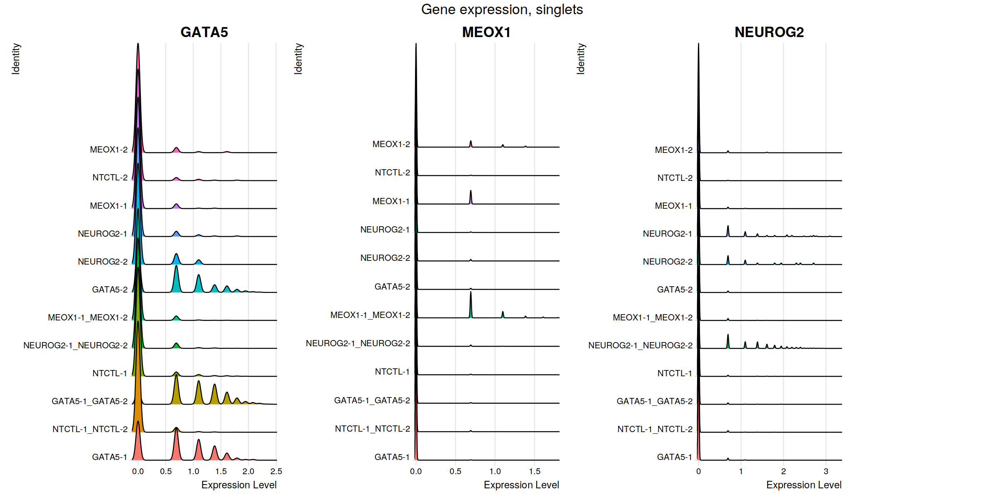

In [240]:
Idents(seurat_singlets) <- "guidecapture_classification"
options(repr.plot.width = 30, repr.plot.height = 10)
tf_list <- tfs_to_plot

Idents(seurat) <- "guidecapture_classification"
RidgePlot(
    seurat_singlets,
    assay = "guidecapture",
    features = guide_names,
    ncol = 4
) +
plot_annotation(title = "Guide capture, singlets") &
theme(plot.title = element_text(hjust = 0.5, size = 20))


RidgePlot(
    seurat_singlets,
    assay = "SCT",
    features = tf_list,
    ncol = 4,
) +
plot_annotation(title = "Gene expression, singlets") &
theme(plot.title = element_text(hjust = 0.5, size = 20))


# How many singlets express both Protospacer1 and 2?

In [241]:
singlet_barcodes <- Cells(seurat_singlets)

In [242]:
select_singlets <- df_guide$barcode_dash %in% singlet_barcodes
df_singlets     <- df_guide[select_singlets,]

In [243]:
singlets_metadata <- seurat_singlets@meta.data['guidecapture_classification']
singlets_metadata['barcode_dash'] <- rownames(singlets_metadata)
head(singlets_metadata)

,guidecapture_classification,barcode_dash
,<chr>,<chr>
AAACAGCCAAAGCCTC-1,GATA5-1,AAACAGCCAAAGCCTC-1
AAACAGCCACATTGCA-1,NTCTL-1_NTCTL-2,AAACAGCCACATTGCA-1
AAACAGCCACCAAAGG-1,GATA5-1_GATA5-2,AAACAGCCACCAAAGG-1
AAACAGCCAGGTTATT-1,GATA5-1_GATA5-2,AAACAGCCAGGTTATT-1
AAACAGCCAGTATGTT-1,GATA5-1_GATA5-2,AAACAGCCAGTATGTT-1
AAACAGCCAGTTATCG-1,NTCTL-1,AAACAGCCAGTTATCG-1


In [244]:
df_singlets <- merge(df_singlets, singlets_metadata, by = "barcode_dash")

In [245]:
head(df_singlets)

,barcode_dash,barcode,GATA5,MEOX1,NEUROG2,NTCTL,n_guides,GATA5_1,GATA5_2,MEOX1_1,⋯,NEUROG2_1,NEUROG2_2,NTCTL_1,NTCTL_2,dominant_gene_w_caveat,dominant_gene_count,percent_dominant_gene,targeted_gene_count,in_multiome,guidecapture_classification
,<chr>,<chr>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<chr>,<int>,<dbl>,<int>,<lgl>,<chr>
1,AAACAGCCAAAGCCTC-1,AAACAGCCAAAGCCTC,107,34,29,23,193,93,14,34,⋯,9,20,0,23,GATA5,107,55.44041,3,TRUE,GATA5-1
2,AAACAGCCACATTGCA-1,AAACAGCCACATTGCA,57,75,82,171,385,33,24,65,⋯,42,40,92,79,NEUROG2,82,21.29870,3,TRUE,NTCTL-1_NTCTL-2
3,AAACAGCCACCAAAGG-1,AAACAGCCACCAAAGG,1266,20,12,17,1315,825,441,20,⋯,10,2,15,2,GATA5,1266,96.27376,3,TRUE,GATA5-1_GATA5-2
4,AAACAGCCAGGTTATT-1,AAACAGCCAGGTTATT,230,104,84,22,440,122,108,85,⋯,65,19,0,22,GATA5,230,52.27273,3,TRUE,GATA5-1_GATA5-2
5,AAACAGCCAGTATGTT-1,AAACAGCCAGTATGTT,1409,81,45,10,1545,670,739,58,⋯,0,45,5,5,GATA5,1409,91.19741,3,TRUE,GATA5-1_GATA5-2
6,AAACAGCCAGTTATCG-1,AAACAGCCAGTTATCG,0,73,45,34,152,0,0,57,⋯,14,31,25,9,MEOX1,73,48.02632,2,TRUE,NTCTL-1


In [246]:
# # Count the singlets where both PSs are captured

# fracs_list <- list()
# guide_list <- c("NEUROG2", "MEOX1", "GATA5", "NTCTL")
# ps_list <- list(
#             'NEUROG2_pss' = c("NEUROG2_1", "NEUROG2_2"),
#             'MEOX1_pss' = c("MEOX1_1", "MEOX1_2"),
#             'GATA5_pss' = c("GATA5_1", "GATA5_2"),
#             'NTCTL_pss' = c("NTCTL_1", "NTCTL_2")
#         )

# for(guide in guide_list) {
#     ps_col_names <- c(paste0(guide, "_1"), paste0(guide, "_2"))
#     select_guide <- df_singlets$guidecapture_classification == guide
    
#     for(ps_pair in names(ps_list)){ 
#         ps_col_names <- ps_list[[ps_pair]]
#         df_dummy <- df_singlets[select_guide, ps_col_names]    
#         both_ps_captured <- (df_dummy[,1] > 0) & (df_dummy[,2] > 0)
#         frac_dual_ps <- round(sum(both_ps_captured)/nrow(df_dummy),2)
#         #print(paste(guide, ps_pair, frac_dual_ps))
#         fracs_list <- rbind(fracs_list, list(guide, ps_pair, frac_dual_ps))
#     }

    
# }

In [247]:
# For singlets
# V1 is assigned barcode
# V2 is the name of the gene/guide where both protospacers are detected in barcode
# V3 is the fraction of barcodes with the both protospacers of gene/guide in V2 

# as.data.frame(fracs_list)

In [ ]:
# save singlets for downstream analysis
singlets_h5_w_gcap_name <- sub(".rds", "_05_SINGLETS.rds", h5_w_gcap_name)
saveRDS(seurat_singlets, singlets_h5_w_gcap_name)